In [1]:
# %%
# Imports and Settings
import os, sys
from pathlib import Path
import numpy as np
import pandas as pd
import scipy
import torch
import scanpy as sc
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib
import seaborn
import PyComplexHeatmap as pch
import scvi
import gseapy
import glasbey
from colorspacious import cspace_convert
import anndata
import re

# antipode & utils
import antipode
from antipode.antipode_model import ANTIPODE
from antipode.model_functions import (
    get_real_leaf_means, numpy_hardmax, group_aggr_anndata
)
from antipode.train_utils import *
from antipode.plotting import get_prerank_from_mat
from genomics import sc_analysis  # from your mts‑utils

# %%
# Device & Figure Defaults
sc.settings.figdir = os.path.expanduser('~/WbFigures/DevFinalAnalysis')
sc._settings.settings._vector_friendly = True

plt.rcParams.update({
    'figure.dpi': 100,
    'savefig.dpi': 300,
    'font.family': 'DejaVu Sans',
    'font.sans-serif': 'DejaVuSansMono',
    'pdf.fonttype': 42
})

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Running on {device}")
if device.type == 'cuda':
    print("GPU count:", torch.cuda.device_count())
    print("GPU name:", torch.cuda.get_device_name(0))

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Running on cpu


In [2]:
# Configuration
model_tag   = '1.9.1.8.5_Dev_final_600clusters'
model_path  = Path('/home/matthew.schmitz/Matthew/models') / model_tag
leaf_key    = 'level_2'
batch_key   = 'batch_name'
discov_key  = 'species'
layer_key   = 'spliced'
MDE_KEY     = 'X_antipode_UMAP'
annotation_path = '/home/matthew.schmitz/Matthew/data/taxtest/annotations/'
gl_path = '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/gene_lists/'


In [3]:
# %%
# 1) Load backed AnnData (only uns & obs)
data_uns = antipode.anndata_utils.read_h5ad_backed_selective(
    '/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/data/taxtest/HvQvM/HvQvMall_cere_clean_nodoublets.h5ad',
    mode='r',
    selected_keys=['uns','general_region','index','_index','obs']
)
# clean index
data_uns.obs.index = (
    data_uns.obs.index
      .to_series().astype(str)
      .str.replace(r'-\d+$','',regex=True)
)
data_uns.obs.index = (
    data_uns.obs.index
      .to_series().astype(str)
      .str.replace(r'-\d+$','',regex=True)
)

# %%
# 2) Load full AnnData + model
adata = sc.read_h5ad(model_path/'p3_adata.h5ad')#,backed='r')
model = ANTIPODE.load(str(model_path), prefix='p3_', device=device, adata=adata)
model.save_params_to_uns()

adata = model.adata_manager.adata
adata.obs.index = adata.obs.index.to_series().str.replace(r'-\d+$','',regex=True)
adata.obs.index = adata.obs.index.to_series().str.replace(r'-\d+$','',regex=True)



/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


INFO     Generating sequential column names                                                                        


/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/pyro/params/param_store.py:334: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  s

In [4]:
# 2.5) Fix some metadata stuff

def longest_atcgn_stretch(series: pd.Series) -> pd.Series:
    pattern = re.compile(r"[ATCGN]+")
    def _longest(s: str) -> str:
        if not isinstance(s, str):
            return ""
        matches = pattern.findall(s.upper())
        return max(matches, key=len) if matches else ""
    return series.map(_longest)
adata.obs['clean_cellname'] = longest_atcgn_stretch(adata.obs.index)

shared_index = adata.obs.index[adata.obs.index.isin(data_uns.obs.index)]
for c in data_uns.obs.columns:
    print(c)
    if not c in adata.obs.columns:
        adata.obs[c] = np.nan
    if adata.obs[c].dtype == 'category':
        data_uns.obs[c] = data_uns.obs[c].astype('category')
        new_cats = list(set(data_uns.obs.loc[shared_index,c].cat.categories) - set(adata.obs.loc[shared_index,c].cat.categories))
        if len(new_cats)>0:
            adata.obs[c] = adata.obs[c].cat.add_categories(new_cats)
        data_uns.obs[c] = data_uns.obs[c].astype(str)
        adata.obs[c] = adata.obs[c].astype(str)
    try:
        adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]
    except:
        print('failed')

G2M_score
S_score
batch_name
clean_cellname
dataset_name


/scratch/fast/1599491/ipykernel_1469580/92079768.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['GSE123335_cortex', 'GSE123335_cortex', 'GSE123335_cortex', 'GSE123335_cortex', 'GSE123335_cortex', ..., '10.1038/s41467-023-43568-6', '10.1038/s41467-023-43568-6', '10.1038/s41467-023-43568-6', '10.1038/s41467-023-43568-6', '10.1038/s41467-023-43568-6']
Length: 1765691
Categories (13, object): ['10.1016/j.stem.2021.11.009', '10.1038/s41467-023-43568-6', '10.1038/s41586-019-1917-5', '10.1038/s41586-021-03910-8', ..., 'PRJNA411878_10x_mouse', 'PRJNA547712_dev_hypothalamus', 'PRJNA637987_lamanno_devmouse', 'Schmitz et al. (this publication)']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]


doublet
full_cellname


/scratch/fast/1599491/ipykernel_1469580/92079768.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[b'TAGTATGTAATA_e14-WT8-1' b'TTCGCATAGGTT_e14-WT8-1'
 b'CCTCCAATTGGC_e14-WT8-1' ...
 b'TTTGTCACAGACGCAA_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut'
 b'TTTGTCACATAACCTG_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut'
 b'TTTGTCATCGGTTCGG_SRR13565274_GSM5047783_GW21-04_cerebellum_Homo_sapiens_RNA-Seq_kOut']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]


general_region
individual


/scratch/fast/1599491/ipykernel_1469580/92079768.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['e14-WT8', 'e14-WT8', 'e14-WT8', 'e14-WT8', 'e14-WT8', ..., 'SRR13565274_GSM5047783_GW21-04_cerebellum_Hom..., 'SRR13565274_GSM5047783_GW21-04_cerebellum_Hom..., 'SRR13565274_GSM5047783_GW21-04_cerebellum_Hom..., 'SRR13565274_GSM5047783_GW21-04_cerebellum_Hom..., 'SRR13565274_GSM5047783_GW21-04_cerebellum_Hom...]
Length: 1765691
Categories (100, object): ['CS12', 'CS13', 'CS14', 'CS15', ..., 'p0-WT2', 'p0-WT3', 'p0-WT4', 'p07']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]


log10_n_counts
msregion


/scratch/fast/1599491/ipykernel_1469580/92079768.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['nan', 'nan', 'nan', 'nan', 'nan', ..., 'nan', 'nan', 'nan', 'nan', 'nan']
Length: 1765691
Categories (18, object): ['cerebellum', 'cge', 'choroid', 'hippo', ..., 'somato', 'temporal', 'thalamus', 'v1']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]


n_counts
n_genes
percent_ribo
phase
region
singlet
species
timepoint
failed


In [5]:
# adata.obs['dataset_name'] = adata.obs['dataset_name'].cat.add_categories(['PRJNA641653'])
adata.obs.loc[adata.obs['dataset_name'].isna()&adata.obs.index.str.contains('SRR1208|SRR1440'),'dataset_name'] = 'PRJNA641653'
adata.obs['dataset_name'] = adata.obs['dataset_name'].replace({'10.1126/science.aat80':'10.1126/science.aat8077','GSE123335_cortex':'PRJNA508375'})
adata.obs.loc[adata.obs['general_region'].isna(),'general_region'] = 'ctx' #just the late-added mouse ctx
adata.obs.loc[adata.obs['batch_name'].str.contains('Thalamic'),'region'] = 'DE'
adata.obs.loc[adata.obs['batch_name'].str.contains('Thalamic'),'general_region'] = 'DE'

In [6]:
adata.obs['species_dataset_name'] = adata.obs['species'].astype(str)+':'+adata.obs['dataset_name'].astype(str)
adata.obs['species'] = adata.obs['species'].astype('category')
adata.obs['phase'] = adata.obs['phase'].astype('category')

In [7]:
adata.obs['species_dataset_name'].value_counts()

species_dataset_name
macaque:Schmitz et al. (this publication)    601986
human:10.1038/s41586-021-03910-8             436186
mouse:PRJNA637987_lamanno_devmouse           257481
human:10.1038/s41593-020-00794-1             150151
mouse:PRJNA641653                             89076
human:10.1038/s41467-023-43568-6              61538
mouse:PRJNA547712_dev_hypothalamus            53903
macaque:10.1126/science.aat8077               52651
mouse:10X_demonstration                       31077
mouse:PRJNA411878_10x_mouse                   27310
human:10.1016/j.stem.2021.11.009              26554
human:10.1038/s41586-019-1917-5               26022
human:Schmitz et al. (this publication)       20773
mouse:PRJNA508375                             14670
human:10.1038/s41588-019-0531-7                5389
Name: count, dtype: int64

In [8]:
# 3) Merge color dicts from data_uns → adata.uns
for x in ['general_region_color_dict','region_colors_dict','region_colors_dict']:
    try:
        data_uns.uns[x] = dict(zip(data_uns.uns[x].keys(),[y.decode() for y in data_uns.uns[x].values()]))
        adata.uns[x] = data_uns.uns[x]
    except:
        print(data_uns.uns[x].values())
        adata.uns[x] = data_uns.uns[x]
        
for x in ['general_region_colors','region_cats','region_colors','species_colors']:
    try:
        data_uns.uns[x] = [y.decode() for y in data_uns.uns[x]]
        adata.uns[x] = data_uns.uns[x]
    except:
        adata.uns[x] = data_uns.uns[x]

# copy the rest
for k,v in data_uns.uns.items():
    adata.uns[k] = v

adata.obs['general_region'] = data_uns.obs['general_region'].astype('category')

# %%
# 4) Core metadata: species colors & UMAP coords
adata.uns['species_color_dict'] = {
    'human':'dodgerblue','macaque':'darkorange','mouse':'limegreen'
}
adata.obsm[MDE_KEY] = np.loadtxt(model_path/"X_umap.csv", delimiter=",")

# %%
# 5) Load mappings & new annotations
maps = pd.read_csv(
    f'{annotation_path}/many_mappings3.txt.gz', index_col=0
).rename({leaf_key:'anno_level_2'},axis=1)
adata.obs[maps.columns] = maps.astype(str)

newa = pd.read_csv(
    f'{annotation_path}/review_annotation_3.csv', index_col=0, skiprows=2
)
adata.obs['new_ccl'] = newa['new_ccl']
adata.obs['new_neighborhood'] = newa['new_neighborhood']

# extend at level_2
ccl_map   = adata.obs.groupby(leaf_key)['new_ccl'].agg(lambda x: x.value_counts().idxmax())
ne_map    = adata.obs.groupby(leaf_key)['new_neighborhood'].agg(lambda x: x.value_counts().idxmax())
adata.obs['ccl_extended'] = adata.obs[leaf_key].map(ccl_map)
adata.obs['new_neighborhood_extended']= adata.obs[leaf_key].map(ne_map)
adata.obs.loc[ adata.obs['ccl_extended']=='Progen_OPC','new_neighborhood_extended'] = 'P'

dict_values(['#08509b', '#840711', '#73c476', 'magenta', '#f4811d', '#fff4b6', '#fee99e', '#fec859', '#feda7e', '#feb23f', '#bc4503', '#ffface', '#d55607', '#fe9829', '#e76b11', '#5b3495', '#228a44', 'goldenrod', '#b51318', '#6aaed6', '#40aa5d', 'tan', '#9e9ac8', '#a10e15', 'cyan', '#c7171c', '#006c2c', '#9dcae1', '#a0d99b', '#4191c6', '#2070b4', '#796eb2'])


/scratch/fast/1599491/ipykernel_1469580/1268075683.py:32: DtypeWarning: Columns (2,9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  maps = pd.read_csv(
/scratch/fast/1599491/ipykernel_1469580/1268075683.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ccl_map   = adata.obs.groupby(leaf_key)['new_ccl'].agg(lambda x: x.value_counts().idxmax())
/scratch/fast/1599491/ipykernel_1469580/1268075683.py:45: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ne_map    = adata.obs.groupby(leaf_key)['new_neighborhood'].agg(lambda x: x.value_counts().idxmax())


In [9]:
# shared_index = adata.obs.index[adata.obs.index.isin(data_uns.obs.index)]
# for c in data_uns.obs.columns:
#     if adata.obs[c].dtype == 'category':
#         new_cats = list(set(data_uns.obs.loc[shared_index,c].cat.categories) - set(adata.obs.loc[shared_index,c].cat.categories))
#         if len(new_cats)>0:
#             adata.obs[c] = adata.obs[c].cat.add_categories(new_cats)
#         data_uns.obs[c] = data_uns.obs[c].astype(str)
#     adata.obs.loc[shared_index,c] = data_uns.obs.loc[shared_index,c]

In [10]:
adata.obs

,Class,G2M_score,S_score,Subclass,batch_name,female,general_region,log10_n_counts,new_ccl,new_neighborhood_extended,...,abc_subclass_markercor,juv_subclass_markercor,linnarson_extended,lamanno_class,lamanno_subclass,lamanno_cluster,neighborhood,curated_class_label,new_neighborhood,ccl_extended
TAGTATGTAATA_e14-WT8,P,0.665049,0.042806,NPC,e14-WT8-1,False,ctx,4.120146,NPC,P,...,320 Astro-OLF NN,320 Astro-OLF NN,NPC,P,NPC,nan,P,Progen Cycling,P,NPC
TTCGCATAGGTT_e14-WT8,T,-0.084758,-0.117966,Ctx_Allo,e14-WT8-1,False,ctx,3.767379,Ctx_Allo,T,...,038 DG-PIR Ex IMN,113 MEA-COA-BMA Ccdc42 Glut,Ctx_Allo,T,Ctx_Allo,nan,O,Erythroid,O,Ctx_Allo
CCTCCAATTGGC_e14-WT8,T,-0.115723,-0.114059,Ctx_Allo,e14-WT8-1,False,ctx,4.064121,Ctx_Allo,T,...,309 CB PLI Gly-Gaba,025 CA2-FC-IG Glut,Ctx_Allo,T,Ctx_Allo,nan,T,Ctx Hip,T,Ctx_Allo
CACGATATCCAT_e14-WT8,ExoGlia,0.273791,-0.049892,Endothelial,e14-WT8-1,False,ctx,4.045870,Endothelial,NN,...,330 VLMC NN,331 Peri NN,Endothelial,ExoGlia,Endothelial,nan,NN,Endothelial,NN,Endothelial
CAGCCGCGCCCT_e14-WT8,T,-0.120023,-0.105050,Ctx_Allo,e14-WT8-1,False,ctx,4.047547,Ctx_Allo,T,...,017 CA3 Glut,017 CA3 Glut,Ctx_Allo,T,Ctx_Allo,nan,T,Ctx Hip,T,Ctx_Allo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_GTTTCTATCAGTTAGC,T,-0.147261,-0.100842,Ctx_IT,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,2.909556,NaN,T,...,020 L2/3 IT RSP Glut,003 L5/6 IT TPE-ENT Glut,Ctx_IT,T,Ctx_IT,nan,nan,nan,NaN,Ctx_IT
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_TGTGTTTGTAGCGTAG,T,-0.068897,-0.032346,Ctx_L5ET,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,2.974512,NaN,T,...,309 CB PLI Gly-Gaba,018 L2 IT PPP-APr Glut,Ctx_L5ET,T,Ctx_L5ET,nan,nan,nan,NaN,Ctx_L5ET
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_TACTCATCACCAGATT,T,-0.061093,-0.063057,Ctx_IT,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,2.945469,NaN,T,...,016 CA1-ProS Glut,025 CA2-FC-IG Glut,Ctx_IT,T,Ctx_IT,nan,nan,nan,NaN,Ctx_IT
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_GGGATGAGTTCGCGAC,T,-0.026970,-0.074085,CGE-Ctx_Gaba,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,2.903633,NaN,T,...,046 Vip Gaba,046 Vip Gaba,CGE-Ctx_Gaba,T,CGE-Ctx_Gaba,nan,nan,nan,NaN,CGE_Ctx_Gaba


In [11]:
# %%
# 7) Basic obs cleanup & colors
adata.obs['region'] = adata.obs['region'].astype('category')
adata.uns['region_colors']         = [
    adata.uns['region_colors_dict'][c] for c in adata.obs['region'].cat.categories
]
adata.uns['general_region_colors'] = [
    adata.uns['general_region_color_dict'][c] for c in adata.obs['general_region'].cat.categories
]
adata.uns['species_colors']        = [
    adata.uns['species_color_dict'][c] for c in adata.obs[discov_key].cat.categories
]

# inferred sex
sexmap = pd.read_csv(
    f'{annotation_path}/inferred_sex.csv', index_col=0
)['female'].to_dict()
adata.obs['female'] = adata.obs['batch_name'].map(sexmap)

# %%
# 8) Load cluster_meta & set Division/Initial_Class/markers
meta = pd.read_csv(
    f'{annotation_path}/cluster_meta_5.tsv', sep='\t'
)
# meta['Initial_Class_markers'] = (
#     meta['Initial_Class'] + "_" +
#     meta['core_markers'].fillna('') + "," +
#     meta['core_markers2'].fillna('')
# ).str.replace('nan','').str.replace('_,','').str.replace(',$','',regex=True)

maps = {
    'Neighborhood':       dict(zip(meta['level_2'], meta['Neighborhood'])),
    'Division':              dict(zip(meta['level_2'], meta['Division'])),
    'Initial_Class':           dict(zip(meta['level_2'], meta['Initial_Class'])),
    'Initial_Class_markers':   dict(zip(meta['level_2'], meta['Initial_Class_markers'])),
    # 'core_markers':       dict(zip(meta['level_2'], meta['core_markers']))
}
for col, mp in maps.items():
    adata.obs[col] = adata.obs['level_2'].astype(int).map(mp).astype('category')

# %%
# 9) Drop old hvg/neighbors & merge any missing obs
for k in ['hvg','neighbors']:
    adata.uns.pop(k, None)
extra = set(data_uns.obs.columns) - set(adata.obs.columns)
adata.obs[list(extra)] = data_uns.obs[list(extra)]

# decode full_cellname
adata.obs['full_cellname'] = (
    adata.obs['full_cellname'].str.decode('utf-8').astype(str)
)

In [12]:
# adata.obs.loc[:,["Neighborhood","Division","Initial_Class","Initial_Class_markers","core_markers"]].to_csv(f'{annotation_path}/clustermeta1_to_cell_annotations.tsv',sep='\t')

In [13]:
# 10) Register phase & other colormaps
adata.uns['phase_color_dict'] = {'G1':'teal','G2M':'lightcoral','S':'gold'}
adata.uns['phase_colors']     = [
    adata.uns['phase_color_dict'][p] for p in adata.obs['phase'].cat.categories
]

cmap_defs = {
    'phase_pal':          adata.uns['phase_colors'],
    'godsnot_102':        sc.pl.palettes.godsnot_102,
    'godsnot_big':        sc.pl.palettes.godsnot_102 * 3,
    'bog':                list(adata.uns['species_color_dict'].values()),
}
for name, cols in cmap_defs.items():
    cmap = matplotlib.colors.ListedColormap(cols, name=name)
    try:    matplotlib.colormaps.register(name=name, cmap=cmap)
    except: pass

# ensure categories
adata.obs['level_1'] = adata.obs['level_1'].astype(int).astype('category')
adata.obs['level_2'] = adata.obs['level_2'].astype(int).astype('category')

# # %%
# # 12) Generate and register palettes
hier1 = antipode.plotting.create_hierarchical_palette(
    adata,
    ['Division','Initial_Class','Initial_Class_markers','level_2','level_1'],
    glasbey.create_palette,
    grid_size=128, grid_space="RGB",
    lightness_bounds=(20,80), chroma_bounds=(20,80),
    colorblind_safe=False, as_hex=True,
    hue_cushion=0.05
)

hier2 = antipode.plotting.create_hierarchical_palette(
    adata,
    ['Neighborhood'],
    glasbey.create_palette,
    grid_size=128, grid_space="RGB",
    lightness_bounds=(20,80), chroma_bounds=(20,80),
    colorblind_safe=False, as_hex=True,
    hue_cushion=0.05
)



/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:433: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(current_level)[top_level]
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:433: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby(current_level)[top_level]
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/plotting.py:433: FutureWarning: The default of observed=False is deprecated and will be changed to True in a fu

In [14]:
pstore = adata.uns['param_store']
discov_cluster_params,cluster_params, cluster_labels,var_labels, zero_mask,(prop_taxon, prop_locs,prop_discov_di,prop_discov_dm)=model.calculate_cluster_params(flavor='numpy')
keep_clusters = np.array([x in adata.obs['level_2'].unique() for x in cluster_labels ])
cluster_labels = np.array(cluster_labels)[keep_clusters]
zero_mask = zero_mask[:,keep_clusters,:]
cluster_index = np.array([int(x) for x in cluster_labels])
zero_mask = np.nan_to_num(zero_mask,posinf=np.nan)
discov_cluster_params = discov_cluster_params[:,cluster_index,:] * zero_mask
prop_locs = prop_locs[cluster_index,:]
prop_discov_di = prop_discov_di[:,cluster_index,:] * zero_mask
prop_discov_dm = prop_discov_dm[:,cluster_index,:] * zero_mask
discov_labels=adata.obs[model.discov_key].cat.categories
latent_labels=[str(x) for x in range(pstore['discov_dc'].shape[1])]
n_clusters=model.level_sizes[-1]


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:450: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  zero_mask = (adata.obs.groupby(self.discov_key)[leaf_level].value_counts().unstack().loc[:,cluster_labels]>=cluster_count_threshold).to_numpy()
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:451: RuntimeWarning: divide by zero encountered in divide
  return discov_cluster_params,cluster_params, cluster_labels,var_labels, 1/zero_mask[...,np.newaxis],(prop_taxon, prop_locs,prop_discov_di,prop_discov_dm)


In [15]:
zdw_df = pd.DataFrame(pstore['z_decoder_weight'],columns = var_labels).T

In [16]:
leaf_key = 'Initial_Class_markers_level_2'

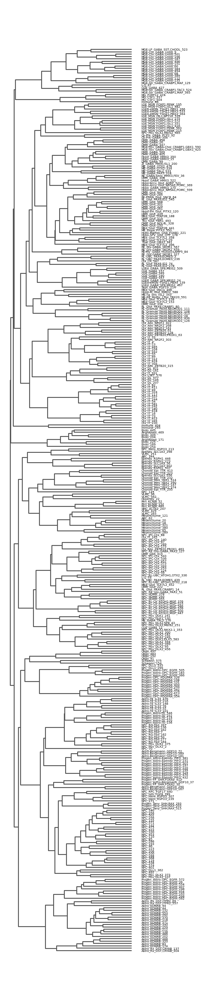

In [17]:
adata.obs['Initial_Class_markers_level_2'] = adata.obs['Initial_Class_markers'].astype(str) + '_' + adata.obs['level_2'].astype(str)
adata.obs['Initial_Class_markers_level_2'] = adata.obs['Initial_Class_markers_level_2'].astype('category')
sc.tl.dendrogram(adata,groupby='Initial_Class_markers_level_2',use_rep='X_antipode',linkage_method='average',cor_method='kendall')
adata.obs['Initial_Class_markers_level_2'] = adata.obs['Initial_Class_markers_level_2'].cat.reorder_categories(adata.uns['dendrogram_'+'Initial_Class_markers_level_2']['categories_ordered'])
sc.tl.dendrogram(adata,groupby='level_2',use_rep='X_antipode',linkage_method='average',cor_method='kendall')
adata.obs['level_2'] = adata.obs['level_2'].cat.reorder_categories(adata.uns['dendrogram_'+'level_2']['categories_ordered'])

with plt.rc_context({'font.size': 6}):
    fig, axs = plt.subplots(
        nrows=1,
        ncols=1,
        figsize=(4,30),
    )
    sc.pl.dendrogram(adata,groupby='Initial_Class_markers_level_2',ax=axs,orientation='left',save='Initial_Class_markers_level_2_left.svg')

leaf_l2_dict = dict(zip(adata.obs['Initial_Class_markers_level_2'].cat.categories,adata.obs['level_2'].cat.categories))
l2_leaf_dict = dict(zip(adata.obs['level_2'].cat.categories,adata.obs['Initial_Class_markers_level_2'].cat.categories))
# leaf_labels = [l2_leaf_dict[x] for x in cluster_labels]

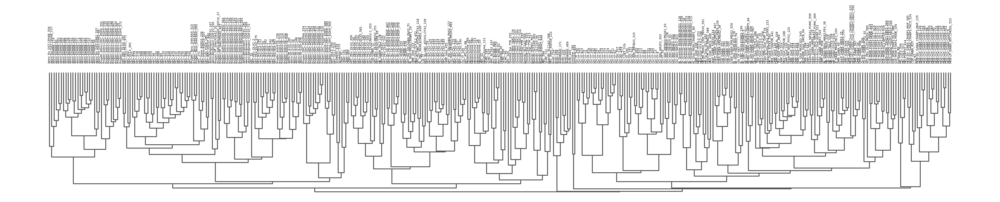

In [18]:
with plt.rc_context({'font.size': 6}):
    fig, axs = plt.subplots(
        nrows=1,
        ncols=1,
        figsize=(30,4),
    )
    sc.pl.dendrogram(adata,groupby='Initial_Class_markers_level_2',ax=axs,orientation='bottom',save='Initial_Class_markers_level_2_right.svg')

leaf_l2_dict = dict(zip(adata.obs['Initial_Class_markers_level_2'].cat.categories,adata.obs['level_2'].cat.categories))
l2_leaf_dict = dict(zip(adata.obs['level_2'].cat.categories,adata.obs['Initial_Class_markers_level_2'].cat.categories))
# leaf_labels = [l2_leaf_dict[x] for x in cluster_labels]

In [19]:
adata.uns['level_2_colors'] = [adata.uns['level_2_colors_dict'][x] for x in adata.obs['level_2'].cat.categories]
adata.uns['Initial_Class_markers_level_2_colors'] = [adata.uns['level_2_colors_dict'][leaf_l2_dict[x]] for x in adata.obs['Initial_Class_markers_level_2'].cat.categories]
adata.uns['Initial_Class_markers_level_2_colors_dict'] = dict(zip(adata.obs['Initial_Class_markers_level_2'].cat.categories,adata.uns['Initial_Class_markers_level_2_colors']))

In [20]:
adata.obs['clipped_psi_2'] = np.clip(adata.obs['psi_2'],np.quantile(adata.obs['psi_2'] ,0.1),np.quantile(adata.obs['psi_2'] ,0.9))

In [21]:
# adata.obs.to_csv('/home/matthew.schmitz/Matthew/data/taxtest/annotations/2025_obs.txt',sep='\t')

In [22]:
# 6) Cluster parameters from model
pstore = adata.uns['param_store']
(
    discov_cp, cp, labels, var_labels, zm,
    (pt,_, di, dm)
) = model.calculate_cluster_params(flavor='numpy')

# keep only present clusters
keep = np.isin(labels, adata.obs['level_2'].cat.categories.astype(int))
labels = np.array(labels)[keep]
zm     = zm[:,keep,:]
idx    = labels.astype(int)

# apply mask
discov_cp = np.nan_to_num(discov_cp[:,idx,:],posinf=np.nan)*zm
pt        = pt[idx,:]
di        = di[:,idx,:]*zm
dm        = dm[:,idx,:]*zm

prop_locs_dynam = np.einsum('pc,cm->pm', 
                           pt, 
                           pstore['locs_dynam'])

prop_locs = np.einsum('pc,cm->pm', 
                           pt, 
                           pstore['locs'])

# take log of the sum of absolute values per cluster
dynam_var = np.log(np.abs(prop_locs_dynam).sum(axis=1))

# map back to each cell’s level_2 label
dynam_dict = {i: dynam_var[i] for i in range(len(dynam_var))}
adata.obs['log_abs_sum_dynam'] = (
    adata.obs[leaf_key]
        .map(dynam_dict)
)

cluster_idx    = labels

# 2) make string labels for each latent dimension
latent_labels  = [str(i) for i in range(pstore['locs'].shape[1])]

# 3) DataFrame of propagated locations
loc_df = pd.DataFrame(
    prop_locs,
    index=[l2_leaf_dict[x] for x in cluster_idx],
    columns=latent_labels
)

# 4) “Raw” locs (before propagation)
leaf_loc_df = pd.DataFrame(
    pstore['locs'][cluster_idx, :],
    index=cluster_idx,
    columns=latent_labels
)

# 5) add tiny noise for numerical stability
loc_df += np.random.standard_normal(loc_df.shape) * 1e-10

# 6) set the index name so dendrogram code picks it up
loc_df.index.name      = leaf_key
leaf_loc_df.index.name = leaf_key


/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:450: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  zero_mask = (adata.obs.groupby(self.discov_key)[leaf_level].value_counts().unstack().loc[:,cluster_labels]>=cluster_count_threshold).to_numpy()
/allen/programs/celltypes/workgroups/rnaseqanalysis/EvoGen/Team/Matthew/code/scANTIPODE/antipode/antipode_mixins.py:451: RuntimeWarning: divide by zero encountered in divide
  return discov_cluster_params,cluster_params, cluster_labels,var_labels, 1/zero_mask[...,np.newaxis],(prop_taxon, prop_locs,prop_discov_di,prop_discov_dm)


# Metadata figures

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/mini

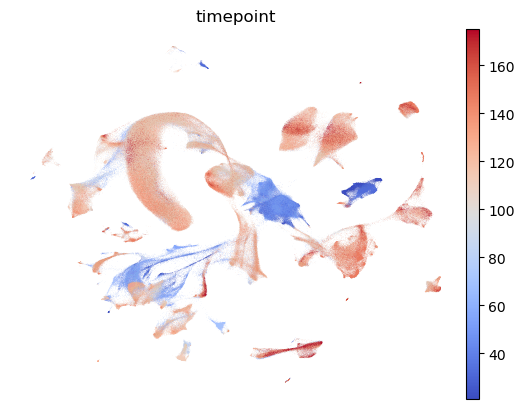

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/mini

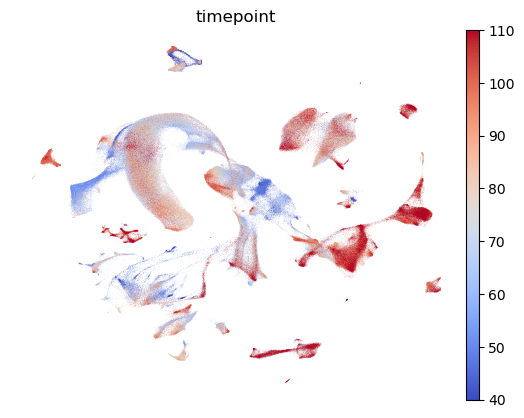

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/matthew.schmitz/Matthew/utils/mini

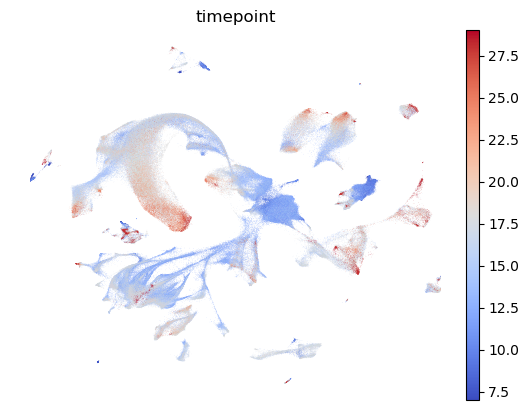

In [23]:
for s in adata.obs['species'].cat.categories:
    sc.pl.embedding(
        adata[adata.obs['species']==s,:], basis=MDE_KEY,
        color=['timepoint'],
        cmap='coolwarm',frameon=False,save=f'{s}_timepoint.pdf'
    )


/scratch/fast/1599491/ipykernel_1469580/4210972160.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df=(adata.obs.groupby(['species','timepoint','batch_name'])['region'].value_counts()>1).astype(int).unstack().reset_index().drop('batch_name',axis=1).groupby(['species','timepoint']).sum()
/scratch/fast/1599491/ipykernel_1469580/4210972160.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df=(adata.obs.groupby(['species','timepoint','batch_name'])['region'].value_counts()>1).astype(int).unstack().reset_index().drop('batch_name',axis=1).groupby(['species','timepoint']).sum()


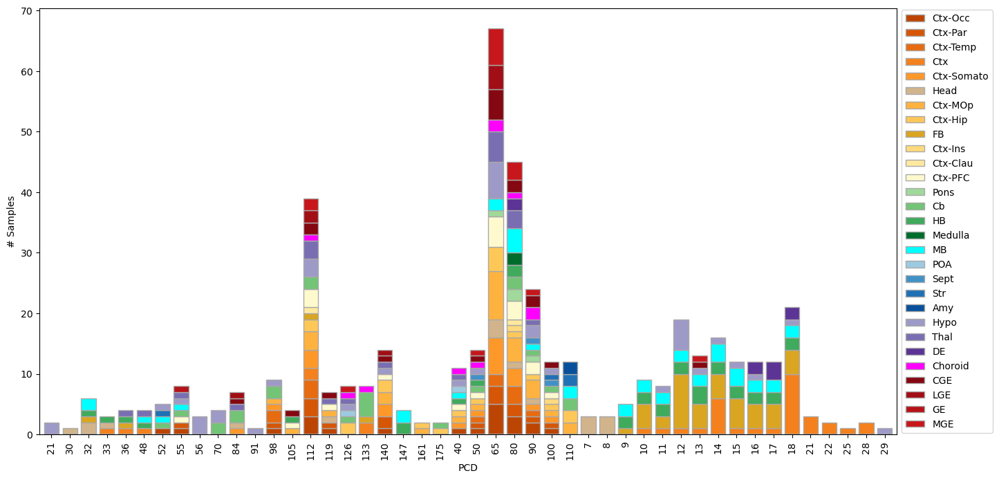

In [24]:
names = sorted(adata.uns['region_colors_dict'].values(), key=lambda c: tuple(matplotlib.colors.rgb_to_hsv(matplotlib.colors.to_rgb(c))))
names
inv_map = {v: k for k, v in adata.uns['region_colors_dict'].items()}
sorted_color_dict=dict(zip([inv_map[x] for x in names],names))
adata.obs['timepoint'] = adata.obs['timepoint'].astype(int)
df=(adata.obs.groupby(['species','timepoint','batch_name'])['region'].value_counts()>1).astype(int).unstack().reset_index().drop('batch_name',axis=1).groupby(['species','timepoint']).sum()
df=df.loc[df.sum(1)>0,:]
df.index=df.index.droplevel(0)#Remove species name from labels for prettiness
sorted_color_dict = {k:v for k,v in sorted_color_dict.items() if k in df.columns}
axes = df.loc[:,sorted_color_dict.keys()].plot.bar(stacked=True,legend=False,color=adata.uns['region_colors_dict'],xlabel='PCD',width=0.8,figsize=(16,8),edgecolor='darkgrey',ylabel='# Samples')
axes.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.savefig(os.path.join(sc.settings.figdir,'master_sample_counts.svg'),format = "svg")
plt.show()

/scratch/fast/1599491/ipykernel_1469580/3409082768.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df=adata.obs.groupby(['species','timepoint'])['region'].value_counts().unstack()


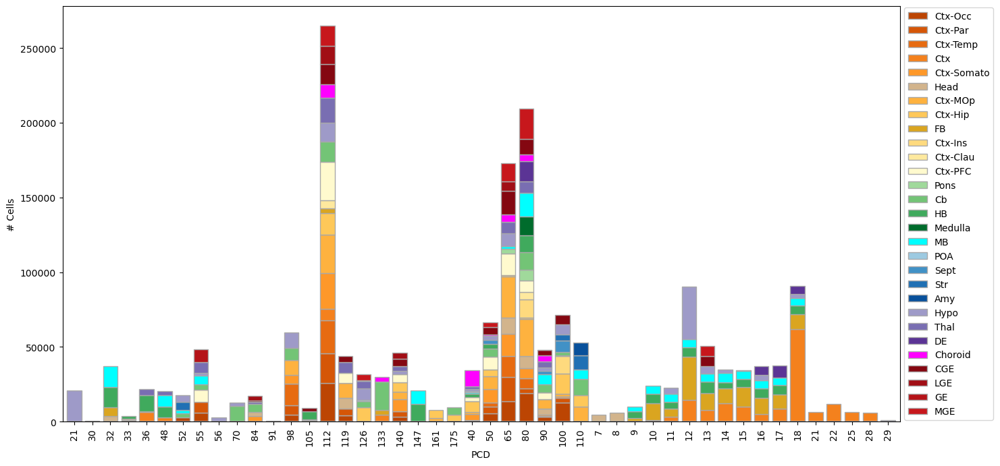

In [25]:
names = sorted(adata.uns['region_colors_dict'].values(), key=lambda c: tuple(matplotlib.colors.rgb_to_hsv(matplotlib.colors.to_rgb(c))))
names
inv_map = {v: k for k, v in adata.uns['region_colors_dict'].items()}
sorted_color_dict=dict(zip([inv_map.get(x,'grey') for x in names],names))
df=adata.obs.groupby(['species','timepoint'])['region'].value_counts().unstack()
df=df.loc[df.sum(1)>0,:]
df.index=df.index.droplevel(0)#Remove species name from labels for prettiness
sorted_color_dict = {k:v for k,v in sorted_color_dict.items() if k in df.columns}
axes = df.loc[:,[x for x in sorted_color_dict.keys() if x in df.columns]].plot.bar(stacked=True,legend=False,color=adata.uns['region_colors_dict'],width=0.8,figsize=(16,8),edgecolor='darkgrey',xlabel='PCD',ylabel='# Cells')
axes.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.savefig(os.path.join(sc.settings.figdir,'master_cell_counts.svg'),format = "svg")
plt.show()

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: UserWarning: The palette list has more values (102) than needed (6), which may not be intended.
  ax = sns.violinplot(


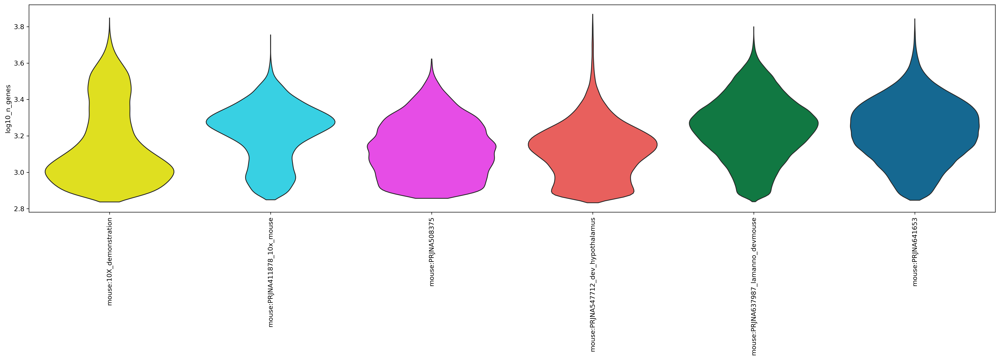

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: UserWarning: The palette list has more values (102) than needed (2), which may not be intended.
  ax = sns.violinplot(


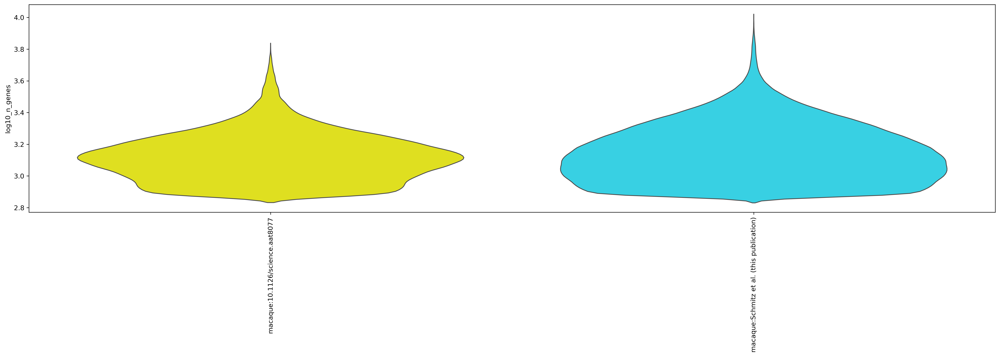

/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/matthew.schmitz/Matthew/utils/miniforge3/envs/rapids-24.12/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:967: UserWarning: The palette list has more values (102) than needed (7), which may not be intended.
  ax = sns.violinplot(


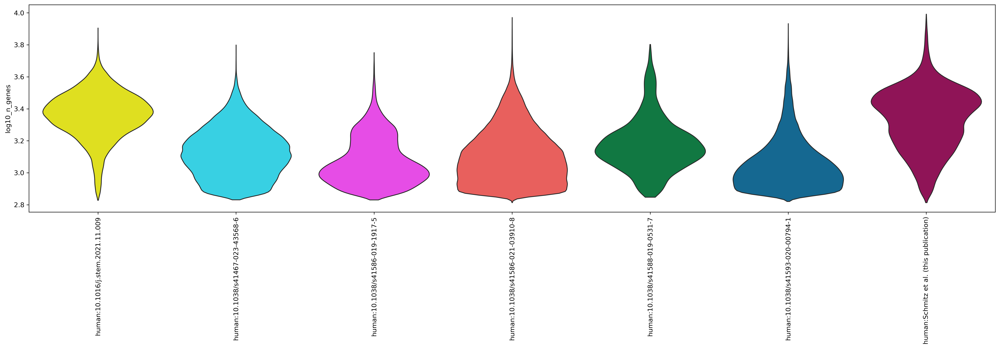

In [26]:
adata.obs['n_genes'] = (adata.X>0).sum(1)
adata.obs['log10_n_genes']=np.log10(adata.obs['n_genes'])
# adata.obs['batch_name']=adata.obs['batch_name'].astype('category')
for s in adata.obs.species.unique():
    with plt.rc_context({"figure.figsize": (20, 6), "figure.dpi": (300)}):
        sc.pl.violin(adata[adata.obs.species==s,:].to_memory(),groupby='species_dataset_name',keys='log10_n_genes',stripplot=False,rotation=90,save=s+'_genes_violins.svg',palette=sc.pl.palettes.godsnot_102)


In [27]:
adata.obs

,Class,G2M_score,S_score,Subclass,batch_name,female,general_region,log10_n_counts,new_ccl,new_neighborhood_extended,...,new_neighborhood,ccl_extended,Neighborhood,Division,Initial_Class,Initial_Class_markers,Initial_Class_markers_level_2,clipped_psi_2,log_abs_sum_dynam,log10_n_genes
TAGTATGTAATA_e14-WT8,P,0.665049,0.042806,NPC,e14-WT8-1,False,ctx,4.120146,NPC,P,...,P,NPC,P,NPC,NPC_PEv,NPC_PEv_DLX2,NPC_PEv_DLX2_2,-0.053085,NaN,3.600646
TTCGCATAGGTT_e14-WT8,T,-0.084758,-0.117966,Ctx_Allo,e14-WT8-1,False,ctx,3.767379,Ctx_Allo,T,...,O,Ctx_Allo,T,TEd,Ctx_Allo,Ctx_Allo_NR2F2,Ctx_Allo_NR2F2_422,-0.053366,NaN,3.285557
CCTCCAATTGGC_e14-WT8,T,-0.115723,-0.114059,Ctx_Allo,e14-WT8-1,False,ctx,4.064121,Ctx_Allo,T,...,T,Ctx_Allo,T,TEd,Ctx_Allo,Ctx_Allo_NR2F2,Ctx_Allo_NR2F2_161,-0.056299,NaN,3.559188
CACGATATCCAT_e14-WT8,ExoGlia,0.273791,-0.049892,Endothelial,e14-WT8-1,False,ctx,4.045870,Endothelial,NN,...,NN,Endothelial,Neighbor,Mesenchyme,VLMC,VLMC,VLMC_211,-0.052394,NaN,3.591176
CAGCCGCGCCCT_e14-WT8,T,-0.120023,-0.105050,Ctx_Allo,e14-WT8-1,False,ctx,4.047547,Ctx_Allo,T,...,T,Ctx_Allo,T,TEd,Ctx_Allo,Ctx_Allo_ZBTB20,Ctx_Allo_ZBTB20_61,-0.053991,NaN,3.553762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_GTTTCTATCAGTTAGC,T,-0.147261,-0.100842,Ctx_IT,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,NaN,2.909556,NaN,T,...,NaN,Ctx_IT,T,TEd,Ctx_IT,Ctx_IT,Ctx_IT_418,-0.044358,NaN,2.856729
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_TGTGTTTGTAGCGTAG,T,-0.068897,-0.032346,Ctx_L5ET,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,NaN,2.974512,NaN,T,...,NaN,Ctx_L5ET,T,TEd,Ctx_L5ET,Ctx_L5ET,Ctx_L5ET_576,-0.049682,NaN,2.933487
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_TACTCATCACCAGATT,T,-0.061093,-0.063057,Ctx_IT,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,NaN,2.945469,NaN,T,...,NaN,Ctx_IT,T,TEd,Ctx_IT,Ctx_IT,Ctx_IT_89,-0.054558,NaN,2.911690
SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_musculus_RNA-Seq_kOut_GGGATGAGTTCGCGAC,T,-0.026970,-0.074085,CGE-Ctx_Gaba,SRR12082764_GSM4635081_RNA-Seq_P1_rep2_Mus_mus...,NaN,NaN,2.903633,NaN,T,...,NaN,CGE_Ctx_Gaba,T,TEv,CGE_GABA,CGE_GABA,CGE_GABA_357,-0.050024,NaN,2.859138


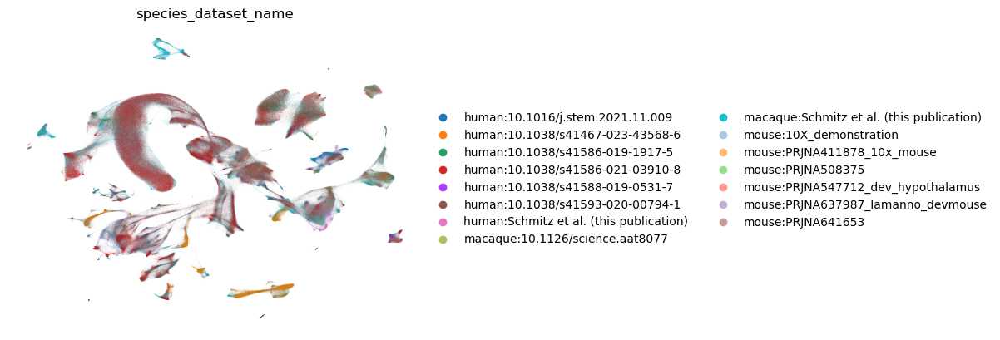

In [28]:
sc.pl.embedding(
    adata, basis=MDE_KEY,
    color=['species_dataset_name'],
    frameon=False,save=f'_species_dataset_name.pdf'
)

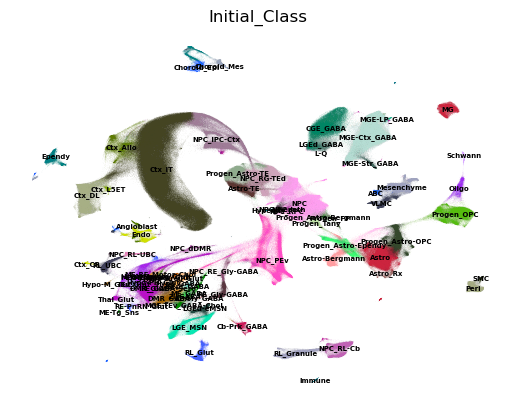

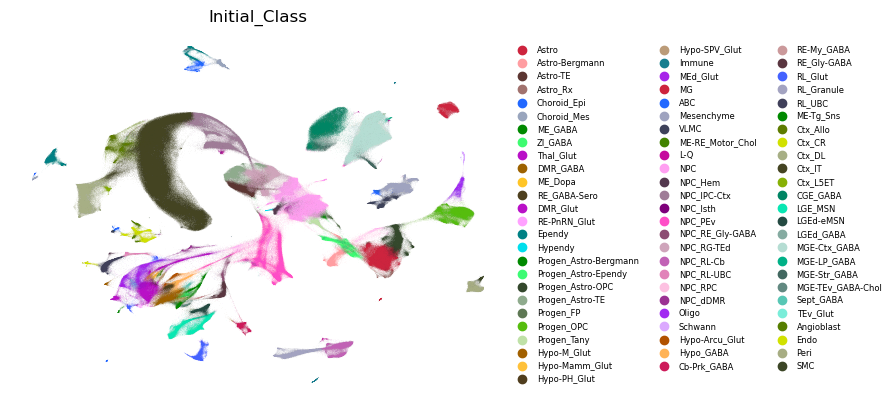

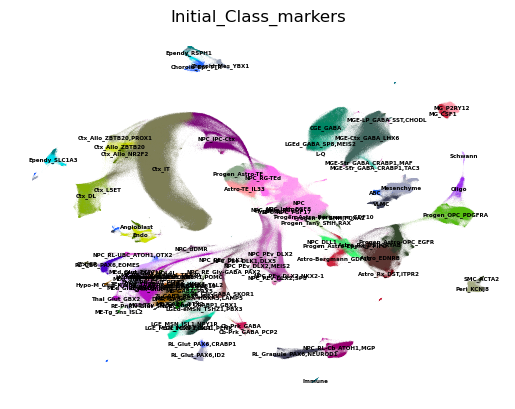

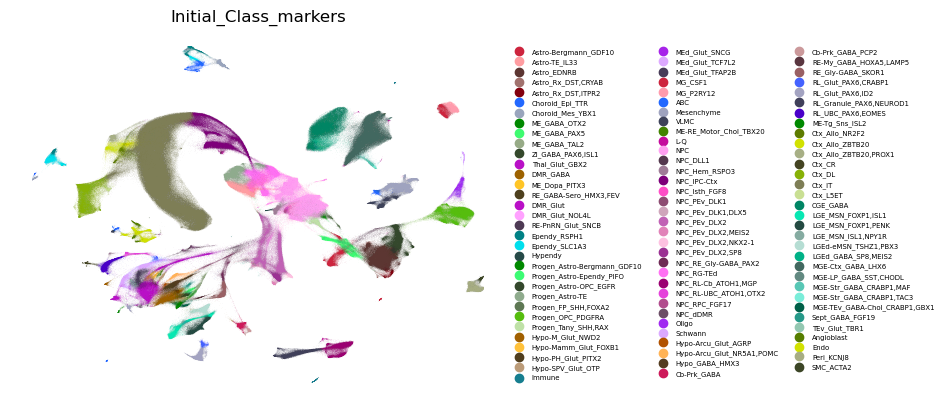

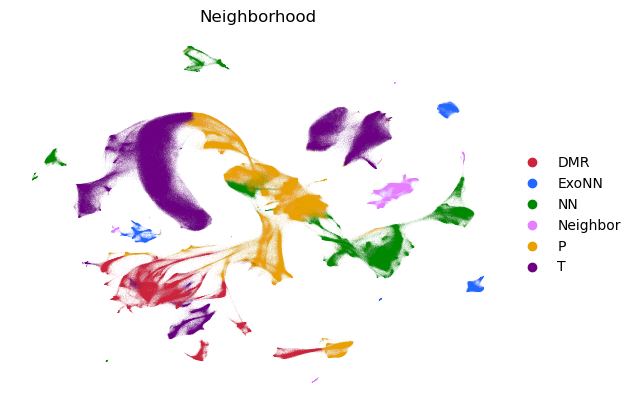

...

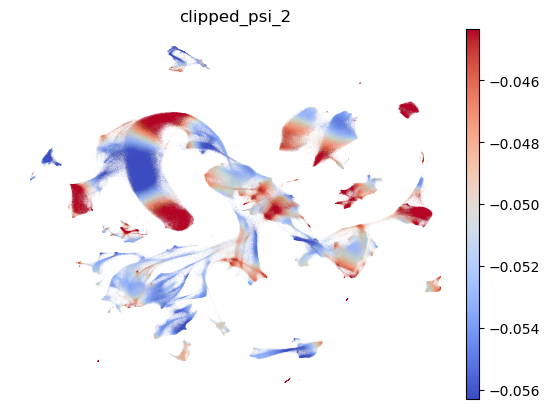

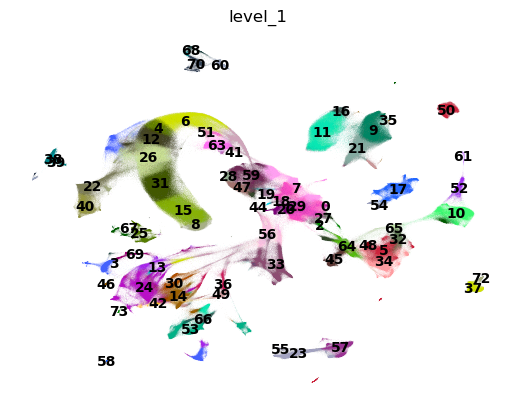

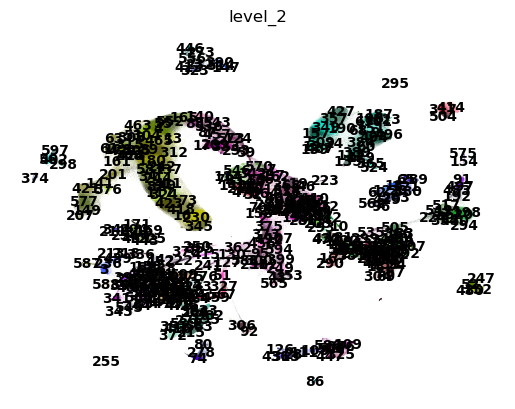

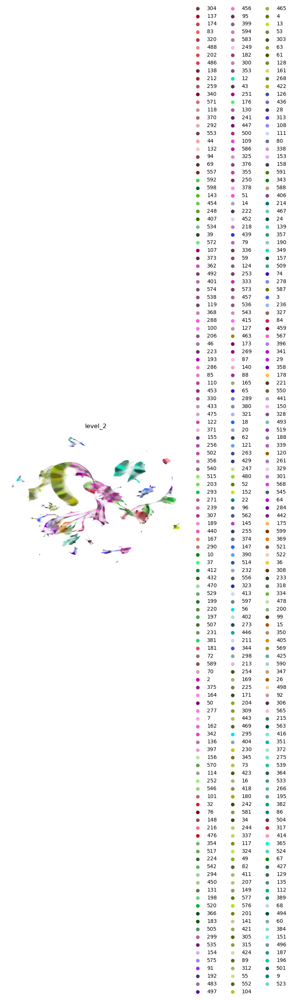

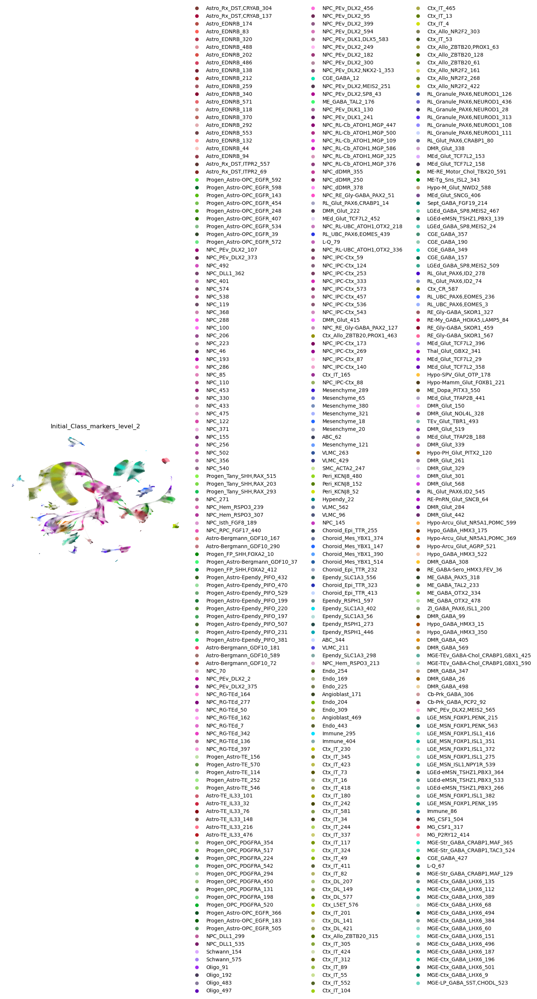

In [29]:
# 13) Embedding plots (looped)
embed_configs = [
    (['Initial_Class'],                     dict(legend_loc='on data',legend_fontsize=5, save='_Initial_Class.pdf',frameon=False)),
    (['Initial_Class'],                     dict(legend_fontsize=6, save='_Initial_Class_legend.pdf',frameon=False)),
    (['Initial_Class_markers'],             dict(legend_loc='on data',legend_fontsize=4, save='_Initial_Class_markers.pdf',frameon=False)),
    (['Initial_Class_markers'],             dict(legend_fontsize=5, save='_Initial_Class_markers_legend.pdf',frameon=False)),
    (['Neighborhood'],                 dict(save='_Neighborhood.pdf',frameon=False)),
    (['Division'],                        dict(save='_class_legend.pdf',frameon=False)),
    (['Division'],                        dict(legend_loc='on data',legend_fontsize=4, save='_class.pdf',frameon=False)),
    (['phase'],                        dict(cmap='phase_pal',legend_fontsize=6,legend_fontweight='normal',save='_cc_phase.pdf',frameon=False)),
    ([batch_key],                      dict(palette=sc.pl.palettes.godsnot_102, save='_batch_name.pdf',frameon=False)),
    ([discov_key],                    dict(palette='bog', save='_species.pdf',frameon=False)),
    (['abc_subclass_markercor'],      dict(palette=sc.pl.palettes.godsnot_102,save='_abc_subclass.pdf',frameon=False)),
    (['region'],                      dict(save='_region.pdf',frameon=False)),
    (['general_region'],              dict(save='_general_region.pdf',frameon=False)),
    (['log_abs_sum_dynam'],           dict(cmap='coolwarm', save='_log_abs_sum_dynam.pdf',frameon=False)),
    (['psi_1'],           dict(cmap='coolwarm', save='_psi_1.pdf',frameon=False)),
    (['clipped_psi_2'],           dict(cmap='coolwarm', save='_psi_2.pdf',frameon=False)),
    (['level_1'],                      dict(legend_loc='on data', save='_level_1.pdf',frameon=False)),
    (['level_2'],                      dict(legend_loc='on data', save='_level_2.pdf',frameon=False)),
    (['level_2'],                      dict(save='_level_2_legend.pdf',frameon=False)),
    (['Initial_Class_markers_level_2'],                      dict(save='_Initial_Class_markers_level_2_legend.svg',frameon=False)),
]
for cols, opts in embed_configs:
    sc.pl.embedding(
        adata, basis=MDE_KEY,
        color=cols,
        **opts
    )

/scratch/fast/1599491/ipykernel_1469580/1110713542.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mat = adata.obs.groupby('Initial_Class_markers_level_2')[key].value_counts(normalize=True).unstack().T


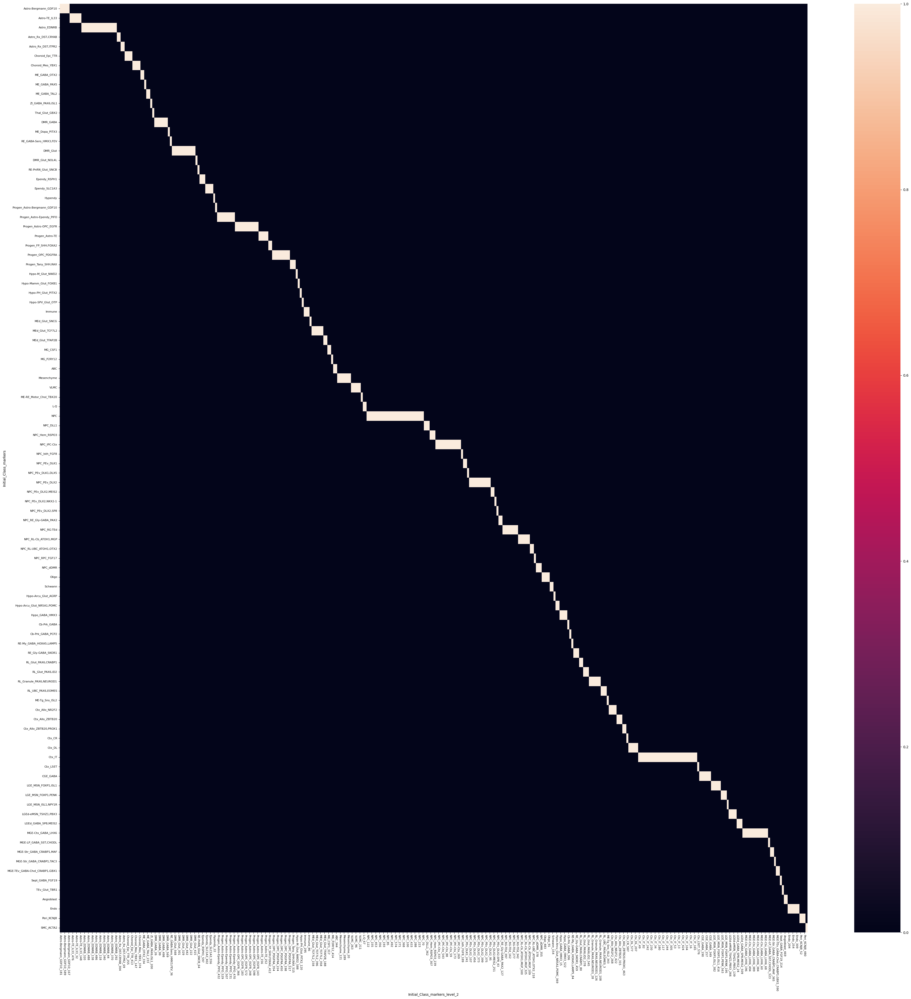

/scratch/fast/1599491/ipykernel_1469580/1110713542.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mat = adata.obs.groupby('Initial_Class_markers_level_2')[key].value_counts(normalize=True).unstack().T


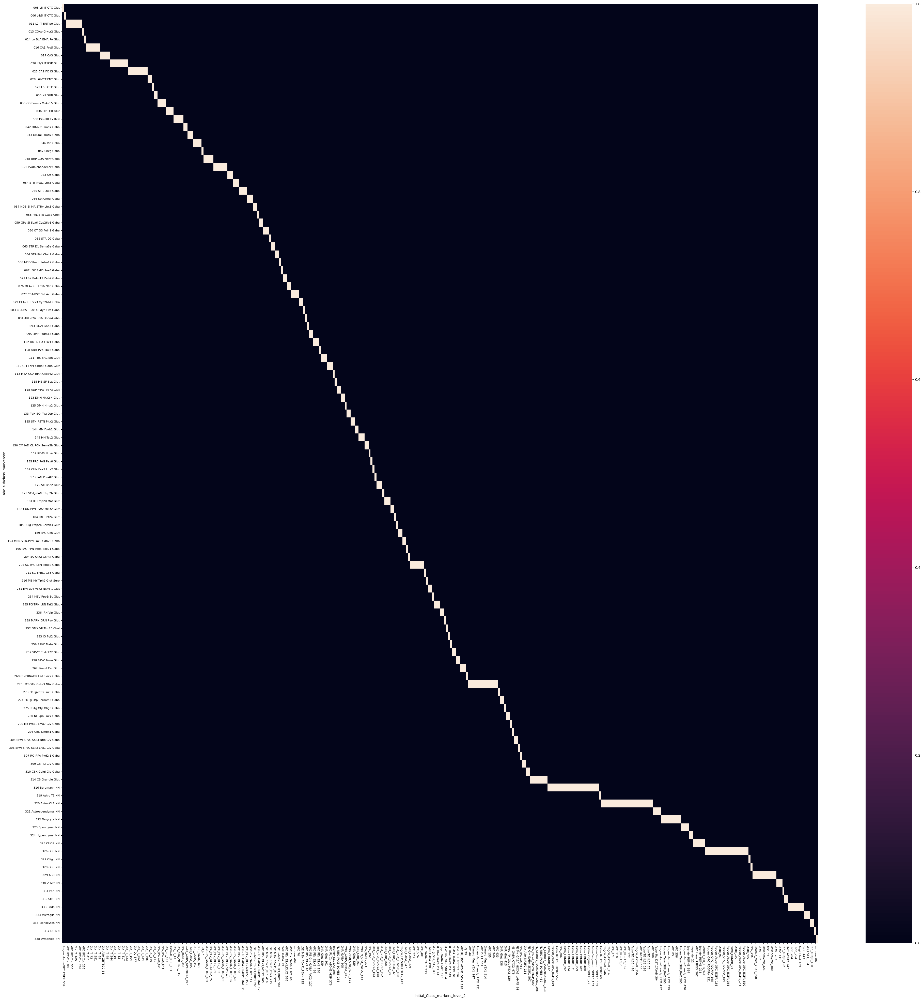

In [30]:
# %%
# 16) Heatmaps for Initial_Class vs cluster matching
for key in ['Initial_Class_markers','abc_subclass_markercor']:
    mat = adata.obs.groupby('Initial_Class_markers_level_2')[key].value_counts(normalize=True).unstack().T
    diag = sc_analysis.maximize_diagonality(mat.values)
    df   = pd.DataFrame(diag[0], index=mat.index, columns=mat.columns[diag[2]])
    sc_analysis.create_heatmap(df)
    plt.xticks(rotation=270)
    plt.savefig(os.path.join(sc.settings.figdir,f'{key}_jaccard.svg'))
    plt.show()

In [31]:
row_linkage = adata.uns[f'dendrogram_{leaf_key}']['linkage']
cluster_order = adata.uns[f'dendrogram_{leaf_key}']['categories_ordered']
inv_order = np.argsort(adata.uns[f'dendrogram_{leaf_key}']['categories_idx_ordered'])

In [32]:
# row_linkage = scipy.cluster.hierarchy.linkage(loc_df, method='average')
# cluster_order = scipy.cluster.hierarchy.leaves_list(row_linkage)

for lvl in ['Neighborhood','Division','Initial_Class','Initial_Class_markers','level_1','level_2']:
    cols = [adata.uns[f"{lvl}_colors_dict"][x] for x in adata.obs[lvl].cat.categories]
    cmap = matplotlib.colors.ListedColormap(cols,name=f"{lvl}_pal")
    try:    matplotlib.colormaps.unregister(name=f"{lvl}_pal",cmap=cmap)
    except: pass
    try:    matplotlib.colormaps.register(name=f"{lvl}_pal",cmap=cmap)
    except: pass

cluster_labels = cluster_order
discov_labels = adata.obs[discov_key].cat.categories
dc_df=pd.DataFrame(pstore['discov_dc'].var(2).T,index=latent_labels,columns=discov_labels)
prop_di=np.einsum('lc,scg->slg',pt,pstore['discov_di'])
prop_dm=np.einsum('lc,scg->slg',pt,pstore['discov_dm'])
dm_df=pd.DataFrame(prop_dm.var(2).T,index=cluster_labels,columns=discov_labels)
dmt_df=pd.DataFrame((prop_dm.var(1)).T,index=latent_labels,columns=discov_labels)
di_df=pd.DataFrame(prop_di.var(2).T,index=cluster_labels,columns=discov_labels)
adata.obs[leaf_key] = adata.obs[leaf_key].cat.reorder_categories(adata.obs[leaf_key].cat.categories)

In [33]:
adata.uns['level_1_colors_dict'] = {str(k):v for k,v in adata.uns['level_1_colors_dict'].items()}
adata.uns['level_2_colors_dict'] = {str(k):v for k,v in adata.uns['level_2_colors_dict'].items()}
adata.uns[f'{'Initial_Class_markers_level_2'}_colors_dict'] = {str(k):v for k,v in adata.uns[f'{'Initial_Class_markers_level_2'}_colors_dict'].items()}

In [34]:
# 23) Final writes for downstream
anndata.settings.allow_write_nullable_strings = True
adata.obs['female'] = adata.obs['female'].astype(str)
adata.write_h5ad(model_path/'analysis_inprogress.h5ad')
adata.obs.to_csv(model_path/'obs.tsv', sep='\t')
cols = ['batch_name','phase',discov_key,'region','level_1',leaf_key,'clipped_psi_2','timepoint','species_dataset_name','log10_n_counts','Neighborhood','Initial_Class','level_2','Initial_Class_markers_level_2','Division','Initial_Class_markers','abc_subclass_markercor','juv_Initial_Class_markercor']
adata.obs = adata.obs.loc[:,[x for x in cols if x in adata.obs.columns]]
adata.obs = adata.obs.loc[:,~adata.obs.columns.duplicated()]
adata.obs['Initial_Class'] = [str(x) for x in adata.obs['Initial_Class']]
del adata.layers[layer_key]
del adata.obsm['discov_onehot']
del adata.obsm['kmeans_onehot']
del adata.obsm['phase_sex']
del adata.obsm['taxon_probs']
adata.obs['Initial_Class'] = adata.obs['Initial_Class'].astype(str)
anndata.settings.allow_write_nullable_strings = False
adata.write(model_path/'for_cellxgene.h5ad')
get_ipython().system(
    f'cp {model_path}/for_cellxgene.h5ad '
    '/allen/programs/celltypes/workgroups/rnaseqanalysis/hct_ux3_cellxgene/anndata_080/V1Evo/'
)
